# Tutorial 1: DLPCF 151671  Spatial clustering task

In this tutorial, we show how to apply STGMVA to identify spatial domains on 10X Visium data. As a example, we analyse the 151671 sample of the dorsolateral prefrontal cortex (DLPFC) dataset. Maynard et al. has manually annotated DLPFC layers and white matter (WM) based on the morphological features and gene markers.

We derived the preprocessed data from the spatialLIBD package, including manual annotations. Before running the model, please download the input data via https://zenodo.org/record/8141084.

## Loading package

In [1]:
import os
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
import squidpy as sq
import numpy as np

In [2]:
from STGMVA.STGMVA import STGMMVE
from STGMVA import read_adata
from STGMVA import mk_dir

2023-07-14 15:21:26.663835: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Reading ST data

The necessary input files includes:
1) The gene expression matrix: filtered_feature_bc_matrix.h5;
2) Spatial coordinates: position.txt;
3) Histology image: the format should be .png.    
    
In the example, position inforamtion has been saved in adata.obsm['spatial']. To make the model can read the data sucessfully, 
please ensure the same format input file as example.

In [3]:
section_id = '151671'
adata = read_adata(section_id) # The read_adata function is defined in the preprocess file.

/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Create directory for pretrained model

In [4]:
save_path='./results_save/'
mk_dir(save_path,section_id)

## Training the model

STGMVA aims to learn the representations by two-step process. First, pretrained the GMM clustering model. Second, discerned the spatial domains for spatial transcriptomics data. 

After model training, the learned representations will be saved in adata.obsm['embedding'], and can be used for spatial clustering. 

In [5]:
model = STGMMVE(adata, save_path=save_path, section_id=section_id)

# model.pretrain() # Train your own pretranined model or use the pretrained model we provided.

adata_res = model.train_cluster()


Graph constructed!


  0%|          | 0/50 [00:00<?, ?it/s]R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 5.4.10
Type 'citation("mclust")' for citing this R package in publications.

  2%|▏         | 1/50 [00:07<06:03,  7.41s/it]

Epoch: 0
NMI=0.673745, ARI=0.545415
Loss=20.0017,  ELBO Loss=56.7078


 12%|█▏        | 6/50 [00:35<04:03,  5.54s/it]

Epoch: 5
NMI=0.688455, ARI=0.549388
Loss=21.1733,  ELBO Loss=46.3717


 22%|██▏       | 11/50 [01:04<03:49,  5.87s/it]

Epoch: 10
NMI=0.685624, ARI=0.554658
Loss=21.7970,  ELBO Loss=41.6953


 32%|███▏      | 16/50 [01:33<03:10,  5.60s/it]

Epoch: 15
NMI=0.690445, ARI=0.565693
Loss=21.7208,  ELBO Loss=39.4914


 42%|████▏     | 21/50 [02:01<02:49,  5.84s/it]

Epoch: 20
NMI=0.687331, ARI=0.562910
Loss=21.8814,  ELBO Loss=38.4218


 52%|█████▏    | 26/50 [02:27<02:04,  5.20s/it]

Epoch: 25
NMI=0.692056, ARI=0.564182
Loss=21.9178,  ELBO Loss=37.7262


 62%|██████▏   | 31/50 [02:59<01:57,  6.17s/it]

Epoch: 30
NMI=0.688092, ARI=0.566395
Loss=21.9583,  ELBO Loss=37.1760


 72%|███████▏  | 36/50 [03:28<01:20,  5.72s/it]

Epoch: 35
NMI=0.688220, ARI=0.569789
Loss=21.9120,  ELBO Loss=36.6520


 82%|████████▏ | 41/50 [03:59<00:57,  6.34s/it]

Epoch: 40
NMI=0.684472, ARI=0.563976
Loss=21.9376,  ELBO Loss=36.2348


 92%|█████████▏| 46/50 [04:28<00:22,  5.64s/it]

Epoch: 45
NMI=0.694450, ARI=0.570117
Loss=21.8661,  ELBO Loss=35.8264


100%|██████████| 50/50 [04:52<00:00,  5.85s/it]


In [6]:
adata_res

AnnData object with n_obs × n_vars = 4110 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'ground_truth', 'ss_label', 'pre_label'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'spatial', 'hvg', 'log1p', 'dlpfc_gt_labels', 'ari_list', 'loss'
    obsm: 'spatial', 'distance_matrix', 'graph_neigh', 'adj', 'feat_mat', 'embedding'

## Visualization

For DLPFC data, the original authors manually annotated the slices. The annotation (metadata.tsv) for 151671 slice can be downloaded from https://zenodo.org/record/8141084. 
For quantitative assessment, we use well-known ARI metric to evaulate the performance. 
Since not all of spots were annotated, we filtered out NA nodes before the ARI calculation and visualization. 

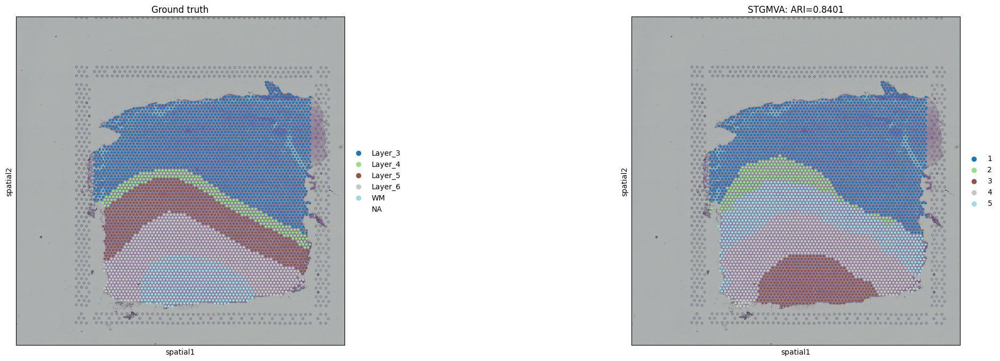

In [9]:

ARI = np.max(adata_res.uns["ari_list"])
sq.pl.spatial_scatter(adata_res, color=["ground_truth","pre_label"],
                      title=["Ground truth",'STGMVA:' + ' ARI=%.4f'%ARI,], palette="tab20",
                      figsize=(12,8))

## UMAP visualization based on latent embeddings

/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Axes: title={'center': 'Predicted labels'}, xlabel='UMAP1', ylabel='UMAP2'>

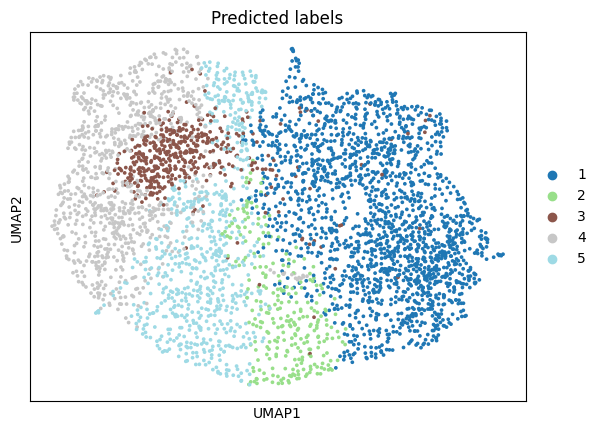

In [12]:
# plotting predicted labels by UMAP
sc.pp.neighbors(adata_res, use_rep='embedding', n_neighbors=10)
sc.tl.umap(adata_res)
sc.pl.umap(adata_res, color='pre_label', title=['Predicted labels'], show=False)